In [1]:
import cv2
cv2.__version__

'3.4.4'

In [4]:
import numpy as np
import matplotlib.pyplot as plt


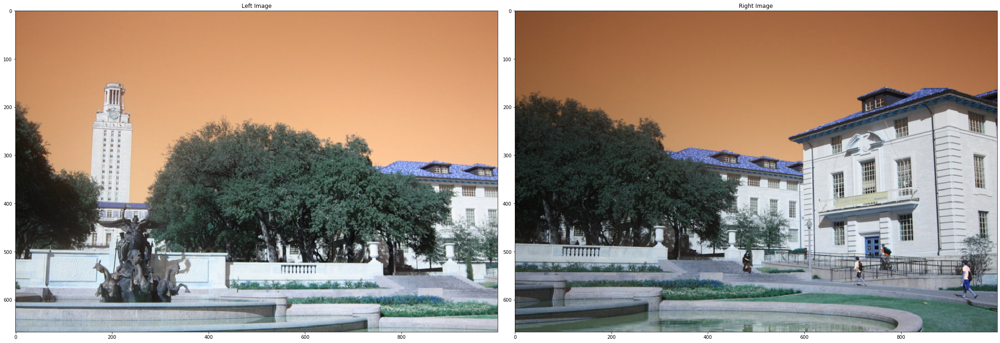

In [8]:
img_right = cv2.imread('/cxldata/projects/uttower_right.jpg')
img_left = cv2.imread('/cxldata/projects/uttower_left.jpg')
plt.figure(figsize=(30,20))

plt.subplot(1,2,1)
plt.title("Left Image")
plt.imshow(img_left)

plt.subplot(1,2,2)
plt.title("Right Image")
plt.imshow(img_right)


plt.tight_layout()

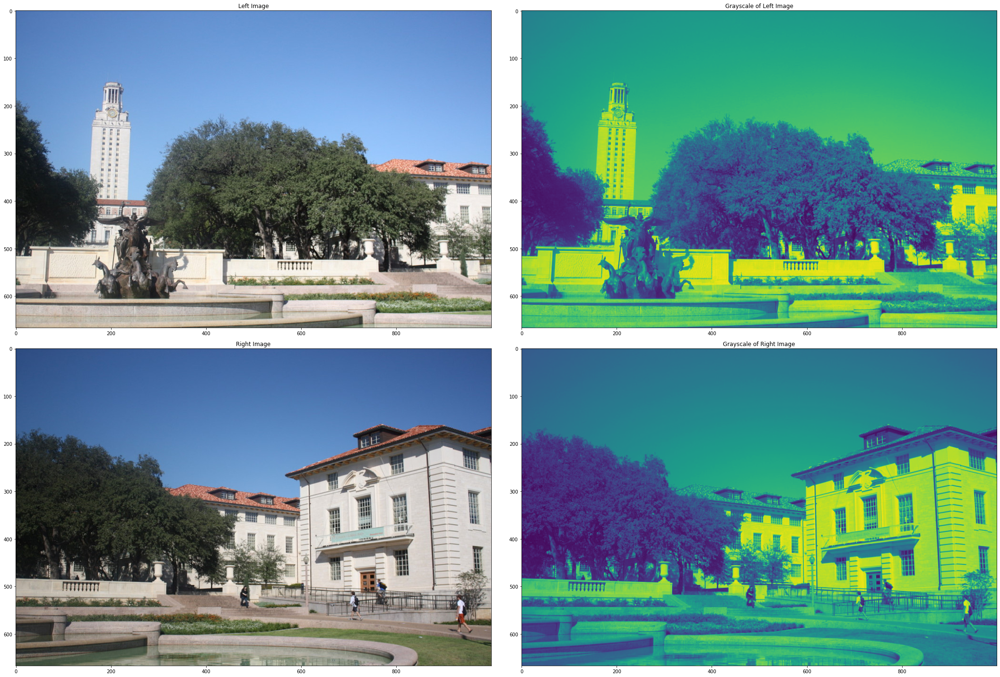

In [12]:
def fixColor(image):
    return(cv2.cvtColor(image,cv2.COLOR_BGR2RGB ))
img1 = cv2.cvtColor(img_right,cv2.COLOR_BGR2GRAY )
img2 = cv2.cvtColor( img_left , cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(30,20))

plt.subplot(2,2,1)
plt.title("Left Image")
plt.imshow(fixColor(img_left))

plt.subplot(2,2,2)
plt.title("Grayscale of Left Image")
plt.imshow(img2)

plt.subplot(2,2,3)
plt.title("Right Image")
plt.imshow(fixColor(img_right))

plt.subplot(2,2,4)
plt.title("Grayscale of Right Image")
plt.imshow(img1)

plt.tight_layout()

In [18]:
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

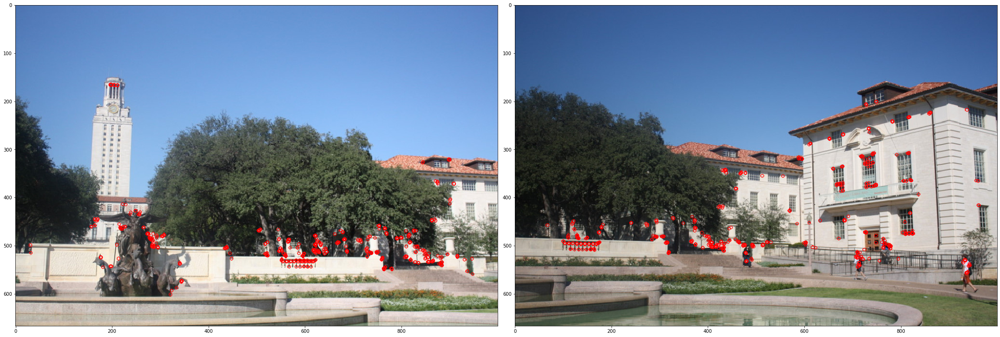

In [29]:
img_right_kp = cv2.drawKeypoints(img_right, kp1, np.array([]), color=(0,0, 255))
img_left_kp = cv2.drawKeypoints(img_left, kp2, np.array([]), color=(0,0, 255))
plt.figure(figsize=(30,20))
plt.subplot(1,2,1)
plt.imshow(fixColor(img_left_kp ))

plt.subplot(1,2,2)
plt.imshow(fixColor(img_right_kp ))
plt.tight_layout()

In [33]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)
matches = sorted(matches, key = lambda x:x.distance)

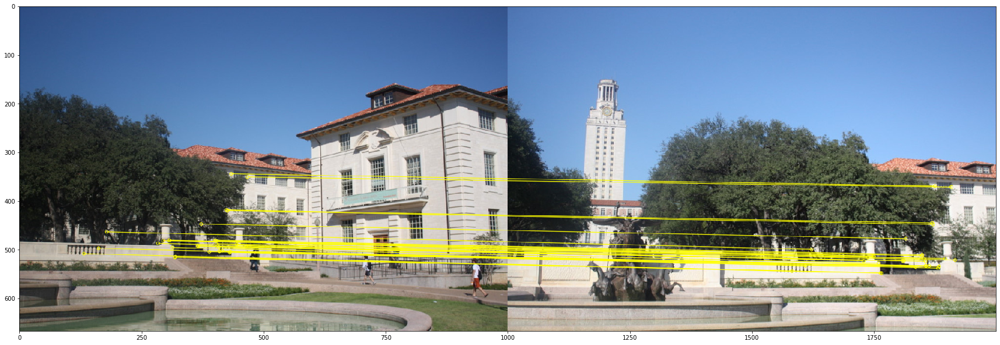

In [38]:
draw_params = dict(matchColor = (255,255,0), # draw matches in yellow color
           flags = 2)
matched_features_image = cv2.drawMatches(fixColor(img_right), kp1, fixColor(img_left), kp2, matches[:30], None,**draw_params)

plt.figure(figsize=(30,20))
plt.imshow(matched_features_image)

In [41]:
if len(matches) >= 4:
    src = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

    H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
else:
    raise AssertionError("Can't find enough keypoints.")

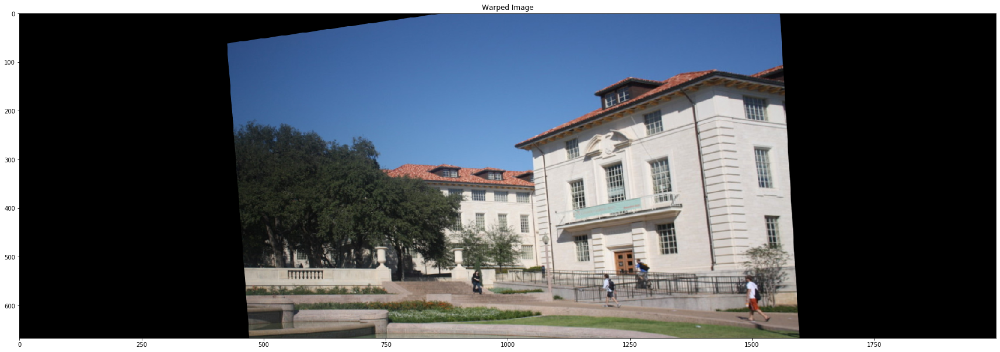

In [45]:
dst = cv2.warpPerspective(img_right,H,(img_left.shape[1] + img_right.shape[1], img_left.shape[0]))
plt.figure(figsize=(30,20))
plt.title('Warped Image') 
plt.imshow(fixColor(dst))

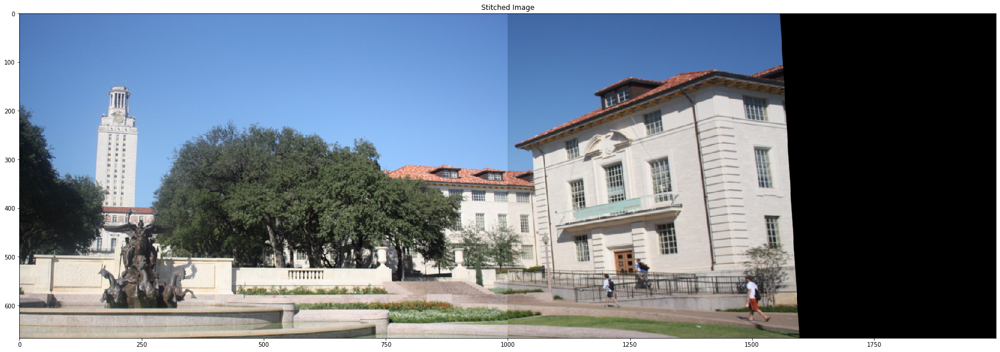

In [48]:
dst[0:img_left.shape[0], 0:img_left.shape[1]] = img_left
cv2.imwrite('resultant_stitched_panorama.jpg',dst)
plt.figure(figsize=(30,20))
plt.title('Stitched Image')
plt.imshow(fixColor(dst))